# Data visualization gallery

In [1]:
%matplotlib inline

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import xarray as xr
import hvplot.xarray
import cartopy.crs as crs
import geoviews as gv
import seaborn as sns

In [4]:
sccoos_thredds = 'http://sccoos.org/thredds/dodsC/autoss/scripps_pier-2019.nc'
dss = xr.open_dataset(sccoos_thredds)

## Basic plots with matplotlib

Text(0.5, 1.0, 'Temperature @ the SIO pier')

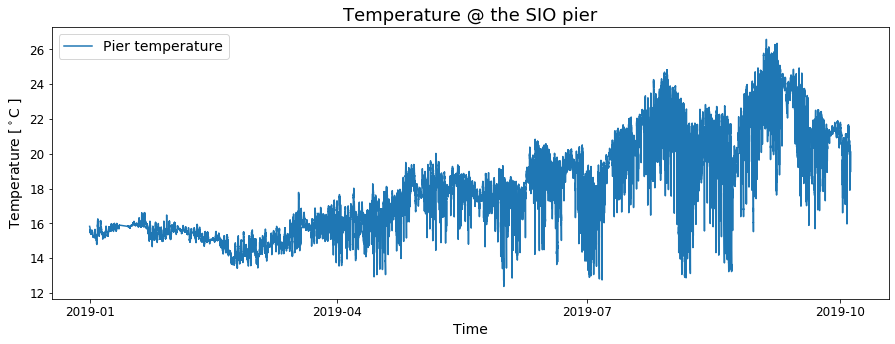

In [5]:
plt.figure(figsize=(15,5))
plt.plot(dss['temperature'].time, dss['temperature'], label='Pier temperature')
plt.ylabel('Temperature [$^\\circ$C ]', fontsize=14)
plt.yticks(fontsize=12)
plt.xlabel('Time', fontsize=14)
plt.xticks(fontsize=12)
plt.legend(fontsize=14)
plt.title('Temperature @ the SIO pier', fontsize=18)

## Interactive plots with Holoviews and Datashader

In [5]:
dss.hvplot.points(x='time', y='temperature', datashade=True, width=800, height=400,
                  title='Temperature @ the SIO pier')

:DynamicMap   []
   :RGB   [time,temperature]   (R,G,B,A)

In [7]:
dsc = xr.open_dataset('http://thredds.cdip.ucsd.edu/thredds/dodsC/cdip/archive/201p1/201p1_historic.nc')
dp = dsc['waveDp'].values
hs = dsc['waveHs'].values

In [9]:
#plt.figure(figsize=(15,15))
#g = sns.jointplot(dp, hs, kind="kde", shade=True, height=8)
#g.set_axis_labels('Dp [deg]', 'Hs [m]', fontsize=16)

## Static maps using matplotlib

### Wind climatology: Colosi et al. (in prep)
<img src="files/Ifremer_swhcor_lsf_parameters_5_par_fit.png">

# Interactive visualization with Xarray, cartopy and geoviews

In [11]:
ds = xr.open_dataset('data/ww3.201206_hs.nc')
hs = ds['hs'].resample(time='5D').interpolate('linear')

In [12]:
proj = crs.LambertCylindrical(central_longitude=0)
hs.hvplot.quadmesh('longitude', 'latitude', projection=proj, project=True, global_extent=True,
 width=600, height=300, cmap='viridis', rasterize=True, dynamic=False,)* gv.feature.coastline

:HoloMap   [time]
   :Overlay
      .Image.I     :Image   [longitude,latitude]   (hs)
      .Coastline.I :Feature   [Longitude,Latitude]